# Clustering

This notebook tests simple K means clustering on lagged morphometric data.

In [39]:
import geopandas as gpd
import pandas as pd
from sklearn import preprocessing
from sklearn.cluster import KMeans
from sklearn import metrics
import seaborn as sns

## Ground truth

In [4]:
gt_data = pd.read_csv('gt_lagged.csv', index_col=0)

In [11]:
gt_blg = gpd.read_file('ground_truth.gpkg', layer='buildings')

In [6]:
gt_data

,sdcLAL_meanIQ3,sdcLAL_rangeIQ3,sdcLAL_theilID3,sdcAre_meanIQ3,sdcAre_rangeIQ3,sdcAre_theilID3,sscCCo_meanIQ3,sscCCo_rangeIQ3,sscCCo_theilID3,sscERI_meanIQ3,...,mtbAli_theilID100,mtbNDi_meanIQ100,mtbNDi_rangeIQ100,mtbNDi_theilID100,ltbIBD_meanIQ100,ltbIBD_rangeIQ100,ltbIBD_theilID100,ltcBuA_meanIQ100,ltcBuA_rangeIQ100,ltcBuA_theilID100
uID,,,,,,,,,,,,,,,,,,,,,
0,13.439658,12.359114,0.082132,70.395488,118.026930,0.262925,0.507640,0.165089,0.013024,0.988772,...,0.084083,2.724002,2.915061,0.125970,3.317160,1.004293,0.015875,0.989800,0.035714,0.000142
1,18.759535,7.178135,0.016938,142.674915,112.711358,0.078459,0.538635,0.127154,0.009833,0.998317,...,0.135532,3.287470,3.434542,0.112166,4.282539,1.713169,0.021220,1.000000,0.000000,0.000019
2,16.524820,16.810215,0.092877,95.004637,173.127320,0.279379,0.464072,0.209310,0.021942,0.983015,...,0.095206,2.276156,2.429855,0.133995,4.179498,3.469969,0.069224,0.988236,0.027027,0.000086
3,13.025338,6.980699,0.049188,61.127404,62.006418,0.157529,0.473053,0.159703,0.013884,0.980940,...,0.082604,1.613737,2.442844,0.209571,2.767117,2.591031,0.098880,0.967672,0.030362,0.000205
4,18.068530,9.706681,0.038987,113.397932,136.197121,0.144824,0.504126,0.179794,0.016773,0.991986,...,0.077760,2.853371,2.907732,0.118521,3.742001,1.979446,0.034235,0.988924,0.032655,0.000139
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7606,15.337585,10.939727,0.092120,83.353919,100.160332,0.356289,0.455284,0.180980,0.022588,0.966544,...,0.252804,2.044605,3.315109,0.273887,3.350244,1.419475,0.021140,0.965863,0.033528,0.000232
7607,17.151305,15.535205,0.141260,96.688269,143.400732,0.420187,0.447839,0.220670,0.026429,0.963500,...,0.252973,2.009457,3.139368,0.269340,3.215012,1.226187,0.019927,0.965610,0.034482,0.000224
7608,23.456300,30.725233,0.144751,222.453005,584.818392,0.408173,0.524805,0.166805,0.012900,0.975031,...,0.220512,2.645628,3.759413,0.292932,4.334594,3.702749,0.073999,0.988107,0.041888,0.000181


In [7]:
scaler = preprocessing.StandardScaler()

In [18]:
gt_norm3 = scaler.fit_transform(gt_data[[c for c in gt_data.columns if '3' in c]])

In [37]:
s = {}

In [38]:
for n in range(2, 15):
    s[n] = []
    for r in range(5):
        kmeans = KMeans(n_clusters=n, random_state=r).fit(gt_norm3)
        labels = kmeans.labels_
        s[n].append(metrics.silhouette_score(gt_norm3, labels, metric='euclidean'))

In [49]:
vals = []
clus = []

for c, v in s.items():
    vals += v
    clus += [c] * 5

In [59]:
silhouettes3 = pd.DataFrame({'n_cluster': clus, 'silhouette': vals})

<AxesSubplot:xlabel='n_cluster', ylabel='silhouette'>

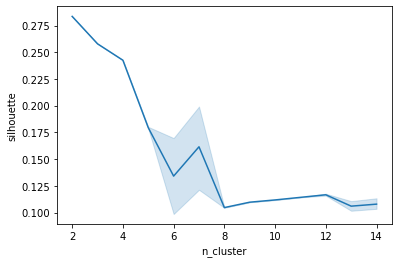

In [60]:
sns.lineplot(x="n_cluster", y="silhouette",
             data=silhouettes3)

In [56]:
kmeans = KMeans(n_clusters=8, random_state=1).fit(gt_norm3)

<AxesSubplot:>

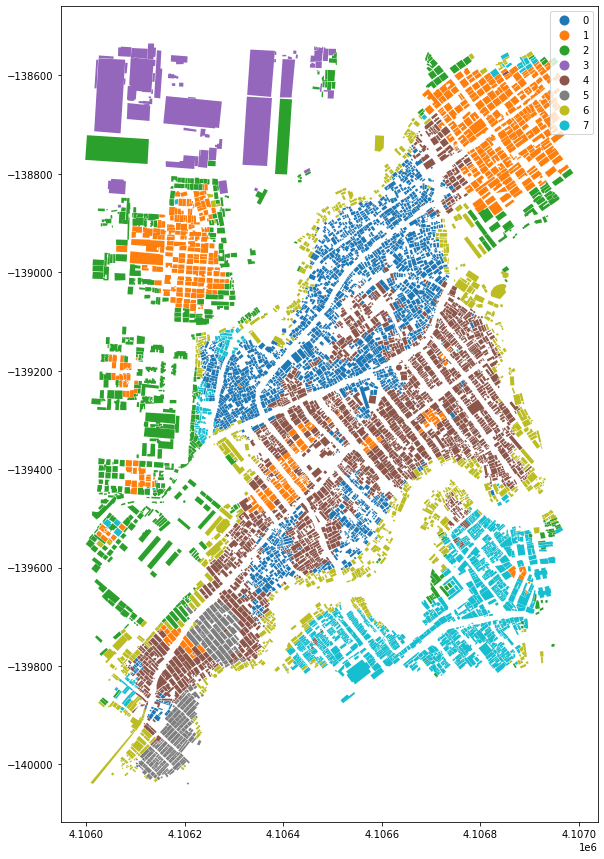

In [57]:
gt_blg.plot(kmeans.labels_, figsize=(15, 15), categorical=True, legend=True)

In [58]:
gt_norm100 = scaler.fit_transform(gt_data[[c for c in gt_data.columns if '100' in c]])

In [61]:
s = {}
for n in range(2, 15):
    s[n] = []
    for r in range(5):
        kmeans = KMeans(n_clusters=n, random_state=r).fit(gt_norm100)
        labels = kmeans.labels_
        s[n].append(metrics.silhouette_score(gt_norm100, labels, metric='euclidean'))

In [62]:
vals = []
clus = []

for c, v in s.items():
    vals += v
    clus += [c] * 5

silhouettes100 = pd.DataFrame({'n_cluster': clus, 'silhouette': vals})

<AxesSubplot:xlabel='n_cluster', ylabel='silhouette'>

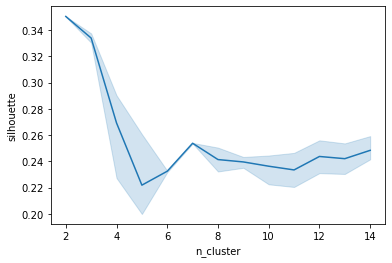

In [63]:
sns.lineplot(x="n_cluster", y="silhouette",
             data=silhouettes100)

In [64]:
kmeans = KMeans(n_clusters=5, random_state=1).fit(gt_norm100)

<AxesSubplot:>

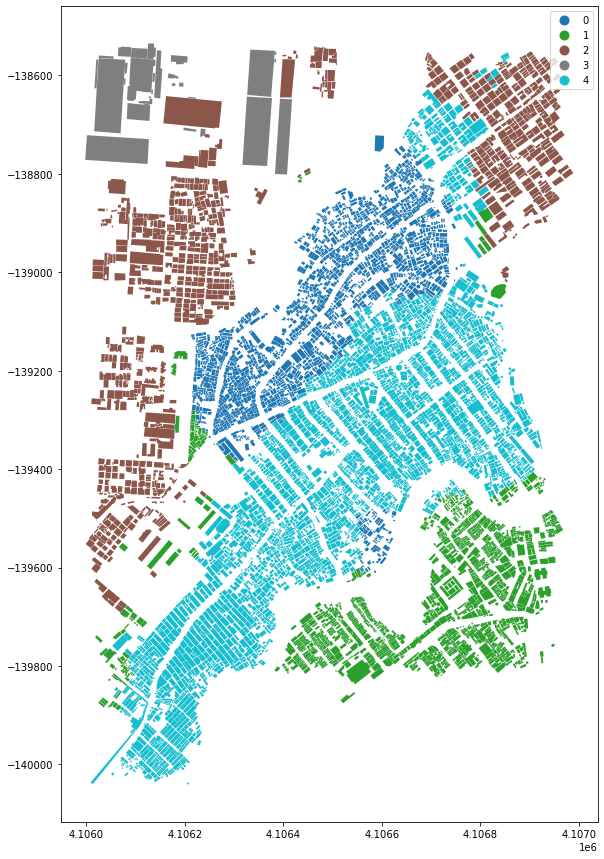

In [65]:
gt_blg.plot(kmeans.labels_, figsize=(15, 15), categorical=True, legend=True)

## Raw

In [66]:
raw_data = pd.read_csv('raw_lagged.csv', index_col=0)
raw_blg = gpd.read_file('raw.gpkg', layer='buildings')

In [67]:
raw_norm3 = scaler.fit_transform(raw_data[[c for c in raw_data.columns if '3' in c]])

<AxesSubplot:xlabel='n_cluster', ylabel='silhouette'>

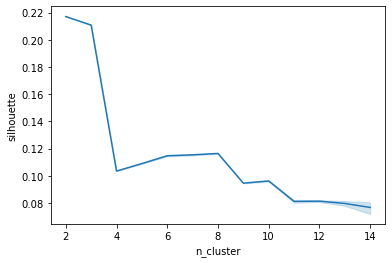

In [68]:
s = {}
for n in range(2, 15):
    s[n] = []
    for r in range(5):
        kmeans = KMeans(n_clusters=n, random_state=r).fit(raw_norm3)
        labels = kmeans.labels_
        s[n].append(metrics.silhouette_score(raw_norm3, labels, metric='euclidean'))

vals = []
clus = []

for c, v in s.items():
    vals += v
    clus += [c] * 5

silhouettes3_raw = pd.DataFrame({'n_cluster': clus, 'silhouette': vals})
sns.lineplot(x="n_cluster", y="silhouette",
             data=silhouettes3_raw)

<AxesSubplot:>

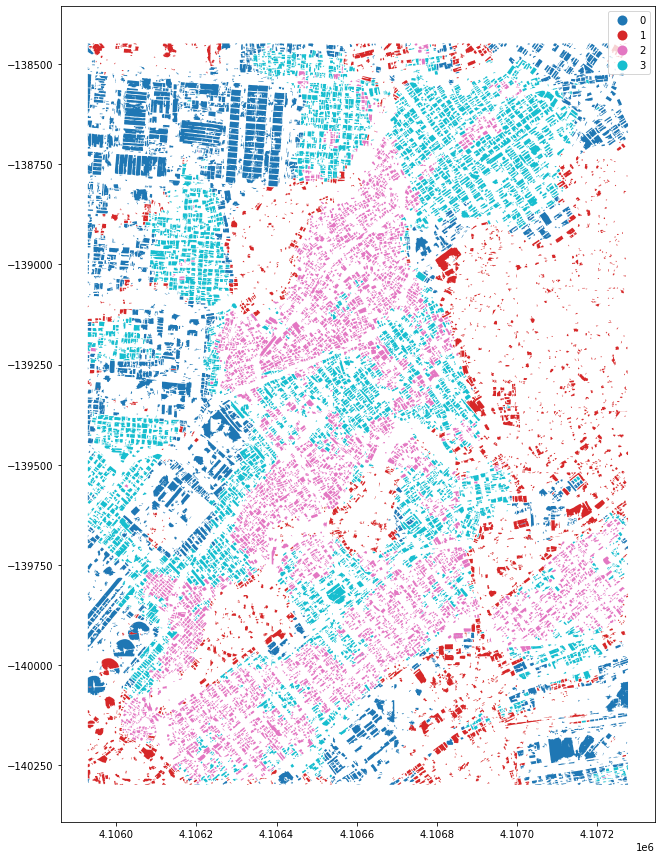

In [69]:
kmeans = KMeans(n_clusters=4, random_state=1).fit(raw_norm3)
raw_blg.plot(kmeans.labels_, figsize=(15, 15), categorical=True, legend=True)

In [70]:
raw_norm100 = scaler.fit_transform(raw_data[[c for c in raw_data.columns if '100' in c]])

<AxesSubplot:xlabel='n_cluster', ylabel='silhouette'>

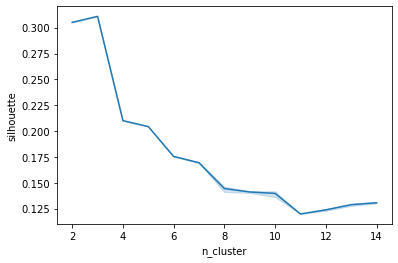

In [72]:
s = {}
for n in range(2, 15):
    s[n] = []
    for r in range(5):
        kmeans = KMeans(n_clusters=n, random_state=r).fit(raw_norm100)
        labels = kmeans.labels_
        s[n].append(metrics.silhouette_score(raw_norm100, labels, metric='euclidean'))

vals = []
clus = []

for c, v in s.items():
    vals += v
    clus += [c] * 5

silhouettes100_raw = pd.DataFrame({'n_cluster': clus, 'silhouette': vals})
sns.lineplot(x="n_cluster", y="silhouette",
             data=silhouettes100_raw)

<AxesSubplot:>

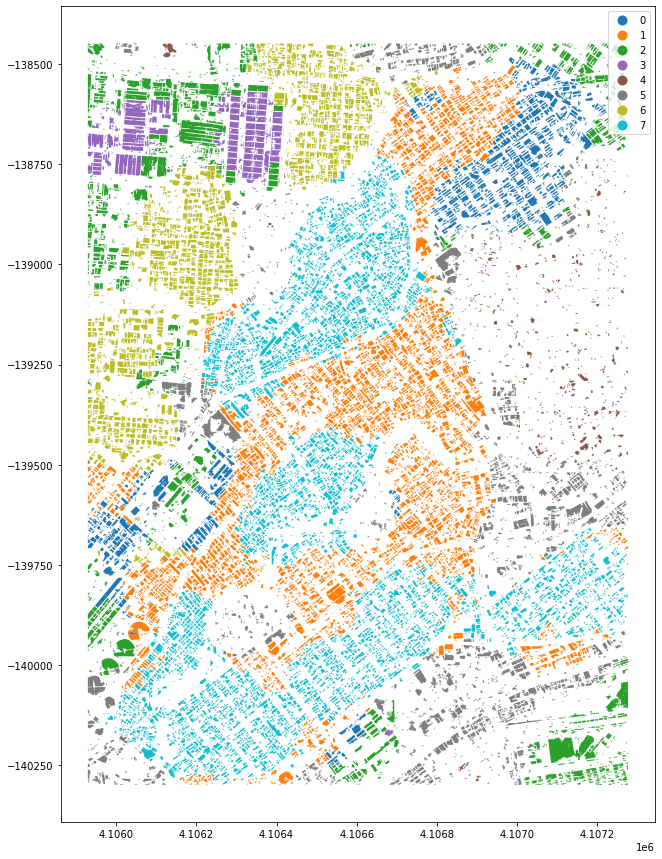

In [74]:
kmeans = KMeans(n_clusters=8, random_state=1).fit(raw_norm100)
raw_blg.plot(kmeans.labels_, figsize=(15, 15), categorical=True, legend=True)

## Clean

In [75]:
clean_data = pd.read_csv('clean_lagged.csv', index_col=0)
clean_blg = gpd.read_file('clean.gpkg', layer='buildings')

In [76]:
clean_norm3 = scaler.fit_transform(clean_data[[c for c in clean_data.columns if '3' in c]])

<AxesSubplot:xlabel='n_cluster', ylabel='silhouette'>

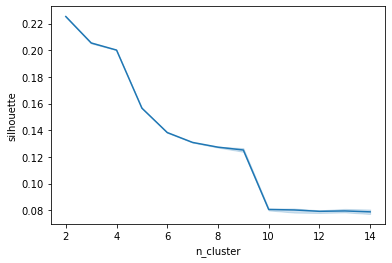

In [77]:
s = {}
for n in range(2, 15):
    s[n] = []
    for r in range(5):
        kmeans = KMeans(n_clusters=n, random_state=r).fit(clean_norm3)
        labels = kmeans.labels_
        s[n].append(metrics.silhouette_score(clean_norm3, labels, metric='euclidean'))

vals = []
clus = []

for c, v in s.items():
    vals += v
    clus += [c] * 5

silhouettes3_clean = pd.DataFrame({'n_cluster': clus, 'silhouette': vals})
sns.lineplot(x="n_cluster", y="silhouette",
             data=silhouettes3_clean)

<AxesSubplot:>

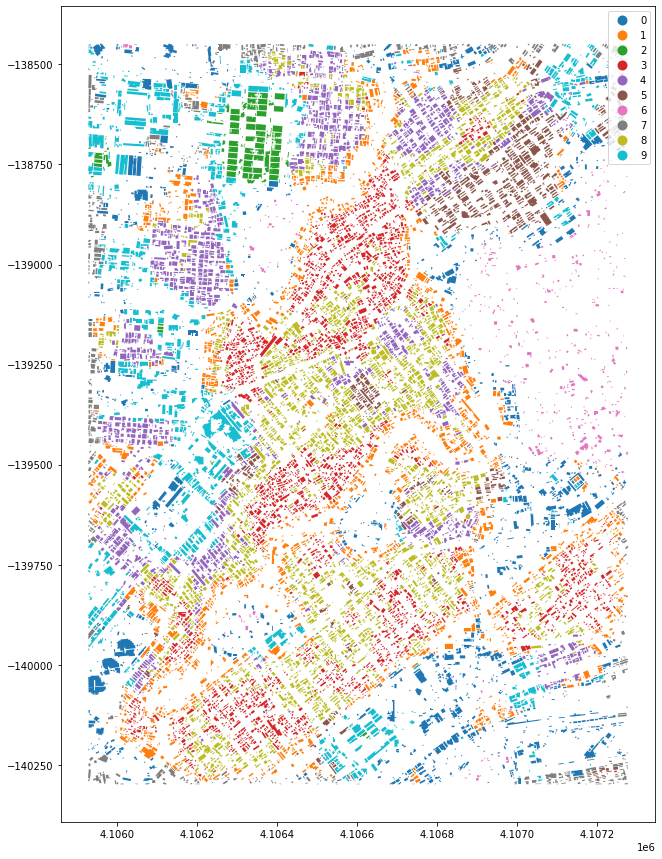

In [80]:
kmeans = KMeans(n_clusters=10, random_state=1).fit(clean_norm3)
clean_blg.plot(kmeans.labels_, figsize=(15, 15), categorical=True, legend=True)

In [78]:
clean_norm100 = scaler.fit_transform(clean_data[[c for c in clean_data.columns if '100' in c]])

<AxesSubplot:xlabel='n_cluster', ylabel='silhouette'>

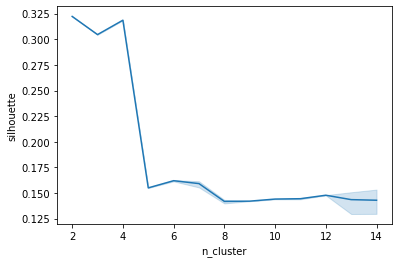

In [79]:
s = {}
for n in range(2, 15):
    s[n] = []
    for r in range(5):
        kmeans = KMeans(n_clusters=n, random_state=r).fit(clean_norm100)
        labels = kmeans.labels_
        s[n].append(metrics.silhouette_score(clean_norm100, labels, metric='euclidean'))

vals = []
clus = []

for c, v in s.items():
    vals += v
    clus += [c] * 5

silhouettes100_clean = pd.DataFrame({'n_cluster': clus, 'silhouette': vals})
sns.lineplot(x="n_cluster", y="silhouette",
             data=silhouettes100_clean)

<AxesSubplot:>

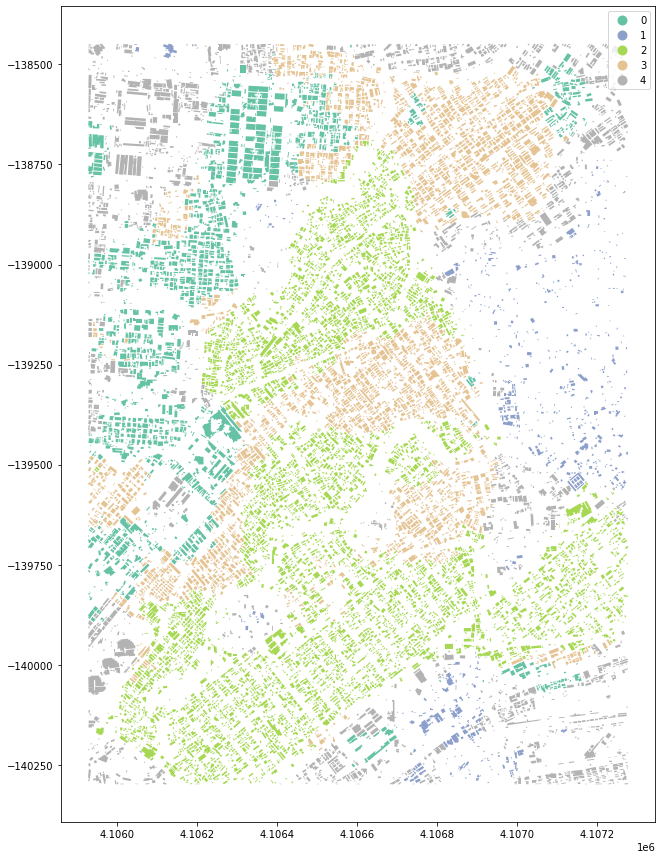

In [83]:
kmeans = KMeans(n_clusters=5, random_state=1).fit(clean_norm100)
clean_blg.plot(kmeans.labels_, figsize=(15, 15), categorical=True, legend=True, cmap='Set2')

<AxesSubplot:>

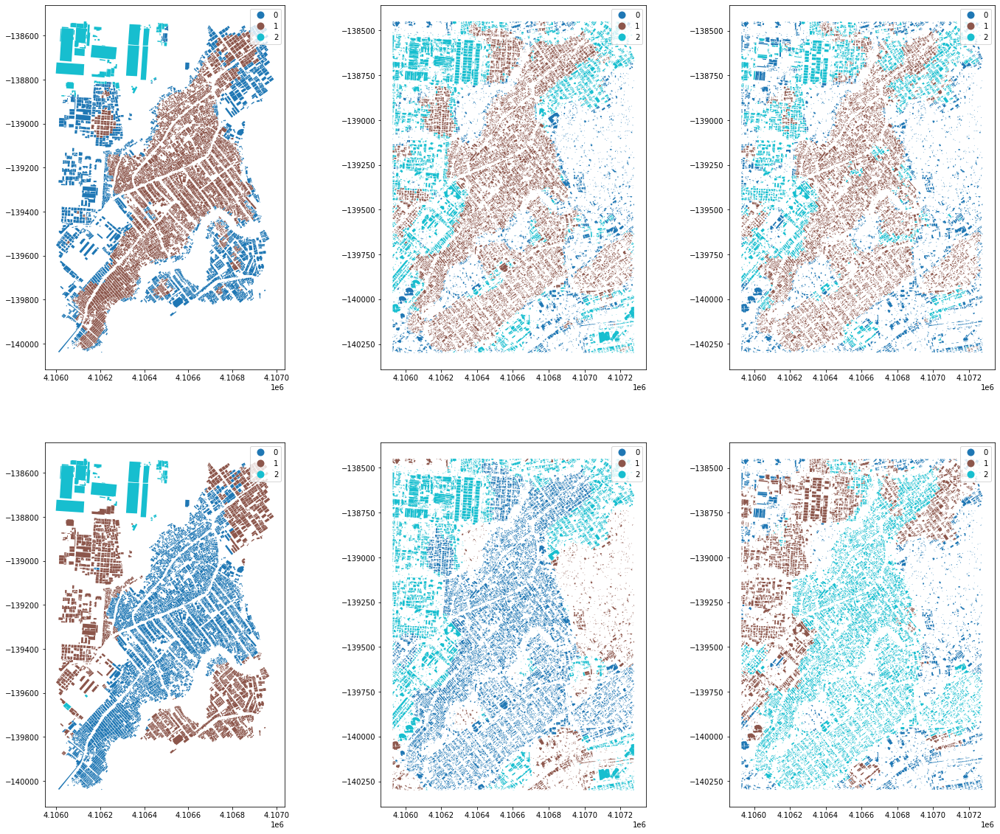

In [87]:
import matplotlib.pyplot as plt

fig, axs = plt.subplots(2, 3, figsize=(24, 20))

k = 3

kmeans = KMeans(n_clusters=k, random_state=1).fit(gt_norm3)
gt_blg.plot(kmeans.labels_, figsize=(15, 15), categorical=True, legend=True, ax=axs[0][0])

kmeans = KMeans(n_clusters=k, random_state=1).fit(raw_norm3)
raw_blg.plot(kmeans.labels_, figsize=(15, 15), categorical=True, legend=True, ax=axs[0][1])

kmeans = KMeans(n_clusters=k, random_state=1).fit(clean_norm3)
clean_blg.plot(kmeans.labels_, figsize=(15, 15), categorical=True, legend=True, ax=axs[0][2])

kmeans = KMeans(n_clusters=k, random_state=1).fit(gt_norm100)
gt_blg.plot(kmeans.labels_, figsize=(15, 15), categorical=True, legend=True, ax=axs[1][0])

kmeans = KMeans(n_clusters=k, random_state=1).fit(raw_norm100)
raw_blg.plot(kmeans.labels_, figsize=(15, 15), categorical=True, legend=True, ax=axs[1][1])

kmeans = KMeans(n_clusters=k, random_state=1).fit(clean_norm100)
clean_blg.plot(kmeans.labels_, figsize=(15, 15), categorical=True, legend=True, ax=axs[1][2])

<AxesSubplot:>

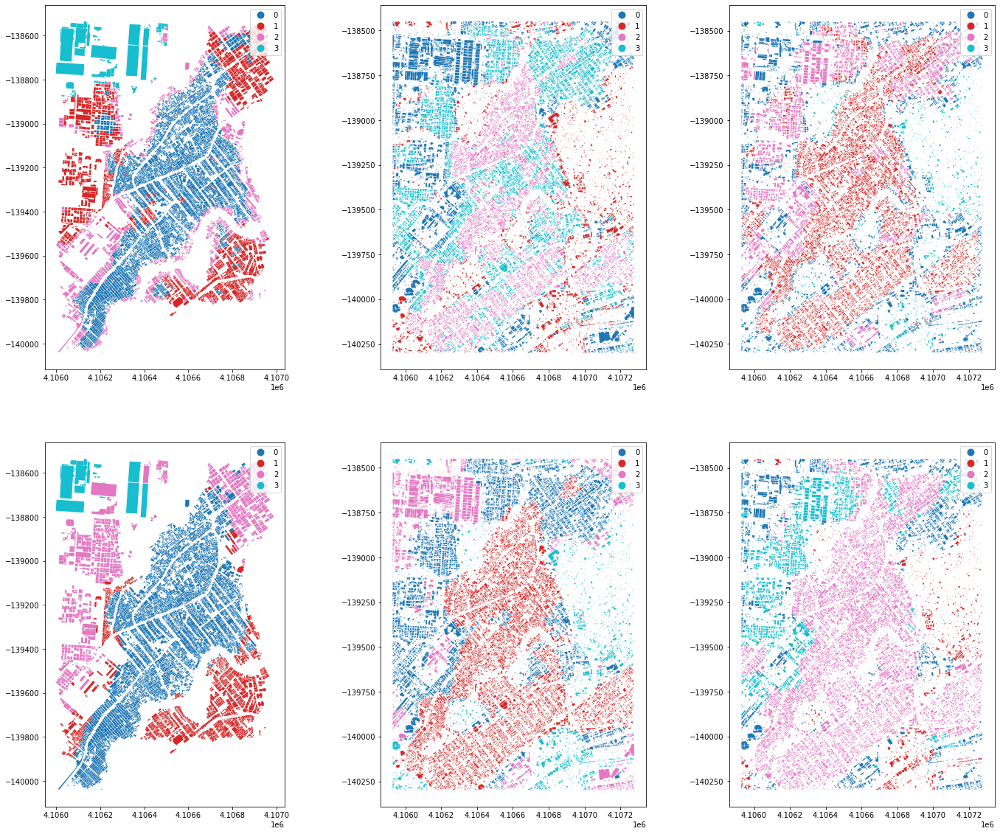

In [88]:
fig, axs = plt.subplots(2, 3, figsize=(24, 20))

k = 4

kmeans = KMeans(n_clusters=k, random_state=1).fit(gt_norm3)
gt_blg.plot(kmeans.labels_, figsize=(15, 15), categorical=True, legend=True, ax=axs[0][0])

kmeans = KMeans(n_clusters=k, random_state=1).fit(raw_norm3)
raw_blg.plot(kmeans.labels_, figsize=(15, 15), categorical=True, legend=True, ax=axs[0][1])

kmeans = KMeans(n_clusters=k, random_state=1).fit(clean_norm3)
clean_blg.plot(kmeans.labels_, figsize=(15, 15), categorical=True, legend=True, ax=axs[0][2])

kmeans = KMeans(n_clusters=k, random_state=1).fit(gt_norm100)
gt_blg.plot(kmeans.labels_, figsize=(15, 15), categorical=True, legend=True, ax=axs[1][0])

kmeans = KMeans(n_clusters=k, random_state=1).fit(raw_norm100)
raw_blg.plot(kmeans.labels_, figsize=(15, 15), categorical=True, legend=True, ax=axs[1][1])

kmeans = KMeans(n_clusters=k, random_state=1).fit(clean_norm100)
clean_blg.plot(kmeans.labels_, figsize=(15, 15), categorical=True, legend=True, ax=axs[1][2])

<AxesSubplot:>

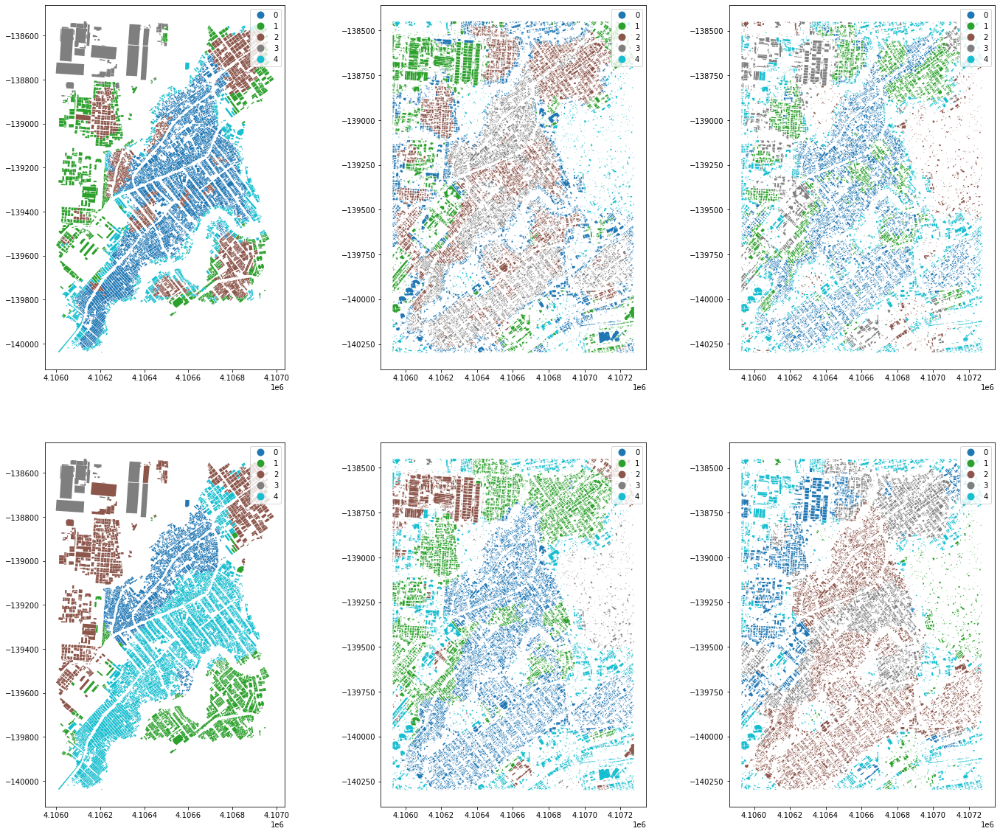

In [89]:
fig, axs = plt.subplots(2, 3, figsize=(24, 20))

k = 5

kmeans = KMeans(n_clusters=k, random_state=1).fit(gt_norm3)
gt_blg.plot(kmeans.labels_, figsize=(15, 15), categorical=True, legend=True, ax=axs[0][0])

kmeans = KMeans(n_clusters=k, random_state=1).fit(raw_norm3)
raw_blg.plot(kmeans.labels_, figsize=(15, 15), categorical=True, legend=True, ax=axs[0][1])

kmeans = KMeans(n_clusters=k, random_state=1).fit(clean_norm3)
clean_blg.plot(kmeans.labels_, figsize=(15, 15), categorical=True, legend=True, ax=axs[0][2])

kmeans = KMeans(n_clusters=k, random_state=1).fit(gt_norm100)
gt_blg.plot(kmeans.labels_, figsize=(15, 15), categorical=True, legend=True, ax=axs[1][0])

kmeans = KMeans(n_clusters=k, random_state=1).fit(raw_norm100)
raw_blg.plot(kmeans.labels_, figsize=(15, 15), categorical=True, legend=True, ax=axs[1][1])

kmeans = KMeans(n_clusters=k, random_state=1).fit(clean_norm100)
clean_blg.plot(kmeans.labels_, figsize=(15, 15), categorical=True, legend=True, ax=axs[1][2])

<AxesSubplot:>

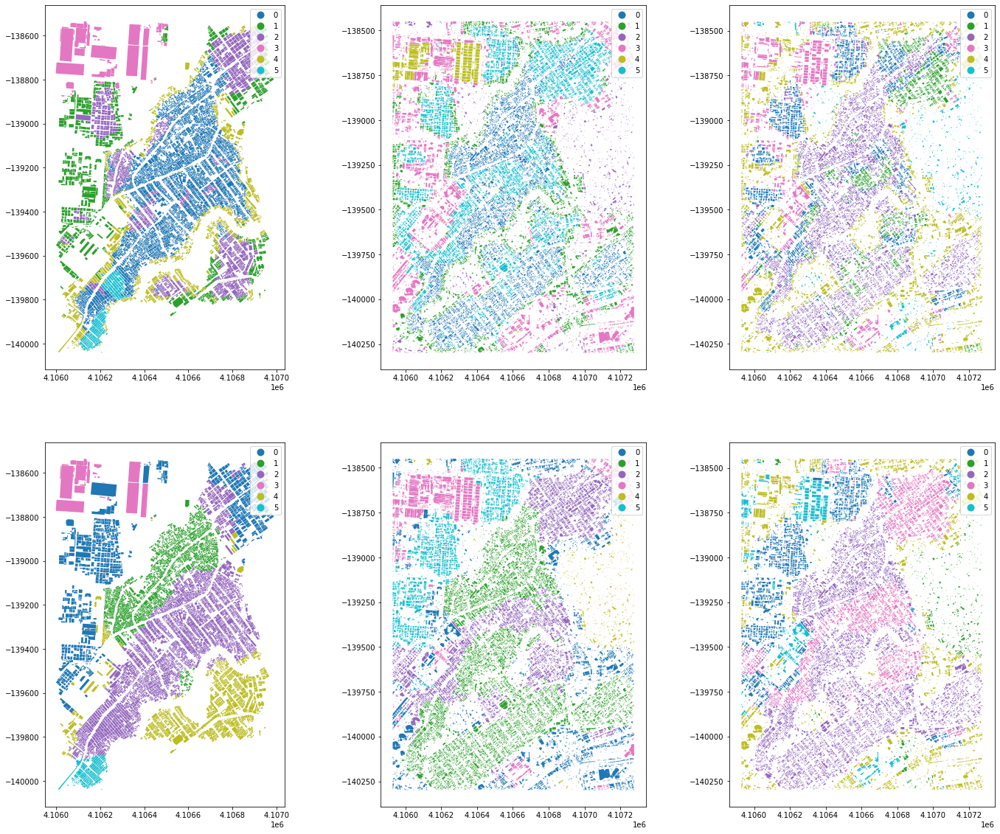

In [90]:
fig, axs = plt.subplots(2, 3, figsize=(24, 20))

k = 6

kmeans = KMeans(n_clusters=k, random_state=1).fit(gt_norm3)
gt_blg.plot(kmeans.labels_, figsize=(15, 15), categorical=True, legend=True, ax=axs[0][0])

kmeans = KMeans(n_clusters=k, random_state=1).fit(raw_norm3)
raw_blg.plot(kmeans.labels_, figsize=(15, 15), categorical=True, legend=True, ax=axs[0][1])

kmeans = KMeans(n_clusters=k, random_state=1).fit(clean_norm3)
clean_blg.plot(kmeans.labels_, figsize=(15, 15), categorical=True, legend=True, ax=axs[0][2])

kmeans = KMeans(n_clusters=k, random_state=1).fit(gt_norm100)
gt_blg.plot(kmeans.labels_, figsize=(15, 15), categorical=True, legend=True, ax=axs[1][0])

kmeans = KMeans(n_clusters=k, random_state=1).fit(raw_norm100)
raw_blg.plot(kmeans.labels_, figsize=(15, 15), categorical=True, legend=True, ax=axs[1][1])

kmeans = KMeans(n_clusters=k, random_state=1).fit(clean_norm100)
clean_blg.plot(kmeans.labels_, figsize=(15, 15), categorical=True, legend=True, ax=axs[1][2])

<AxesSubplot:>

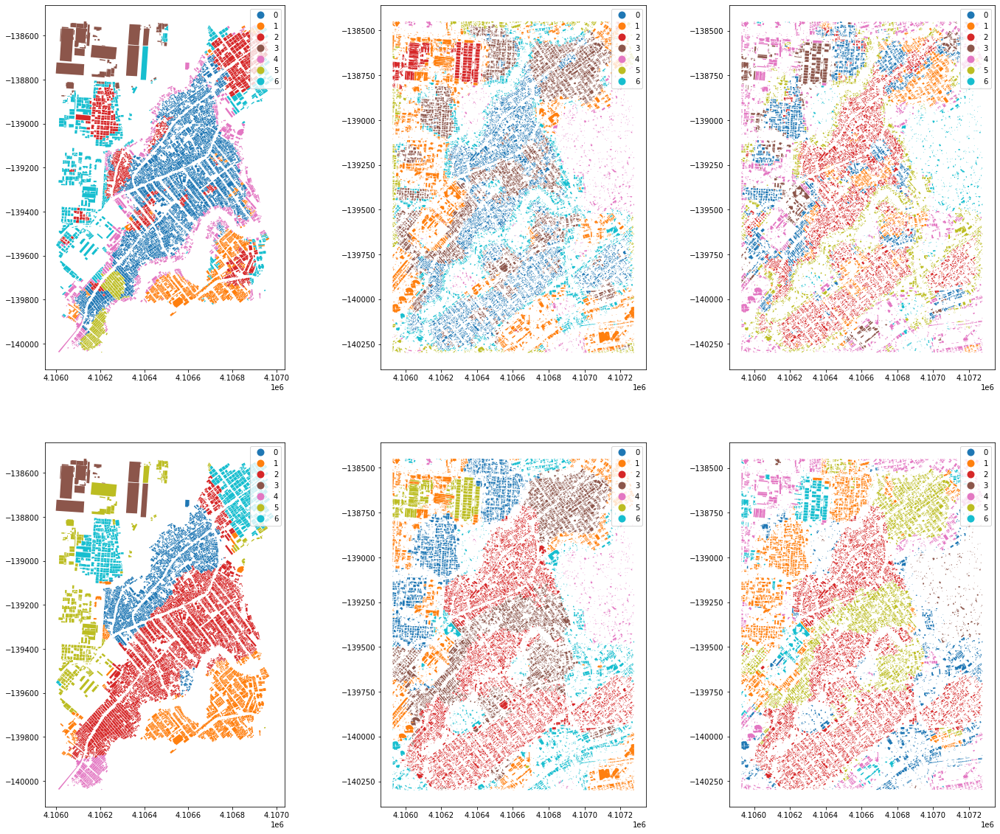

In [91]:
fig, axs = plt.subplots(2, 3, figsize=(24, 20))

k = 7

kmeans = KMeans(n_clusters=k, random_state=1).fit(gt_norm3)
gt_blg.plot(kmeans.labels_, figsize=(15, 15), categorical=True, legend=True, ax=axs[0][0])

kmeans = KMeans(n_clusters=k, random_state=1).fit(raw_norm3)
raw_blg.plot(kmeans.labels_, figsize=(15, 15), categorical=True, legend=True, ax=axs[0][1])

kmeans = KMeans(n_clusters=k, random_state=1).fit(clean_norm3)
clean_blg.plot(kmeans.labels_, figsize=(15, 15), categorical=True, legend=True, ax=axs[0][2])

kmeans = KMeans(n_clusters=k, random_state=1).fit(gt_norm100)
gt_blg.plot(kmeans.labels_, figsize=(15, 15), categorical=True, legend=True, ax=axs[1][0])

kmeans = KMeans(n_clusters=k, random_state=1).fit(raw_norm100)
raw_blg.plot(kmeans.labels_, figsize=(15, 15), categorical=True, legend=True, ax=axs[1][1])

kmeans = KMeans(n_clusters=k, random_state=1).fit(clean_norm100)
clean_blg.plot(kmeans.labels_, figsize=(15, 15), categorical=True, legend=True, ax=axs[1][2])

<AxesSubplot:>

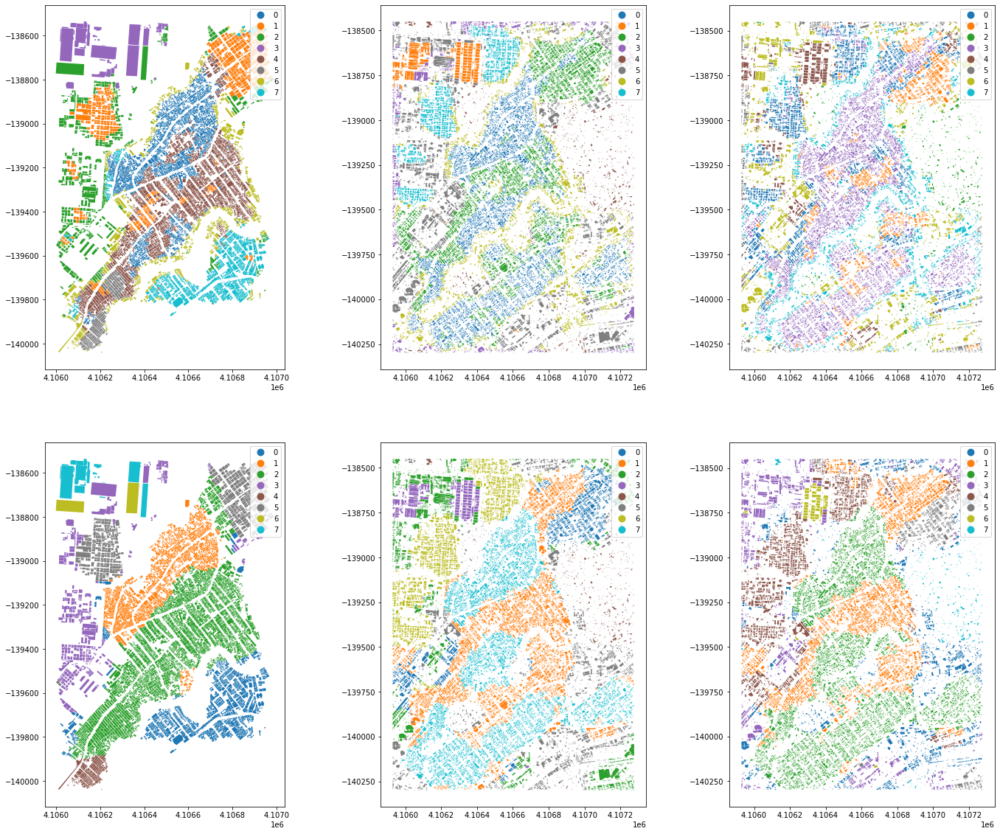

In [92]:
fig, axs = plt.subplots(2, 3, figsize=(24, 20))

k = 8

kmeans = KMeans(n_clusters=k, random_state=1).fit(gt_norm3)
gt_blg.plot(kmeans.labels_, figsize=(15, 15), categorical=True, legend=True, ax=axs[0][0])

kmeans = KMeans(n_clusters=k, random_state=1).fit(raw_norm3)
raw_blg.plot(kmeans.labels_, figsize=(15, 15), categorical=True, legend=True, ax=axs[0][1])

kmeans = KMeans(n_clusters=k, random_state=1).fit(clean_norm3)
clean_blg.plot(kmeans.labels_, figsize=(15, 15), categorical=True, legend=True, ax=axs[0][2])

kmeans = KMeans(n_clusters=k, random_state=1).fit(gt_norm100)
gt_blg.plot(kmeans.labels_, figsize=(15, 15), categorical=True, legend=True, ax=axs[1][0])

kmeans = KMeans(n_clusters=k, random_state=1).fit(raw_norm100)
raw_blg.plot(kmeans.labels_, figsize=(15, 15), categorical=True, legend=True, ax=axs[1][1])

kmeans = KMeans(n_clusters=k, random_state=1).fit(clean_norm100)
clean_blg.plot(kmeans.labels_, figsize=(15, 15), categorical=True, legend=True, ax=axs[1][2])